In [1]:
import stim
import matplotlib.pyplot as plt
import sinter 
from typing import List
import numpy as np
import pymatching
import scipy.stats


In [2]:

def num_to_coordinate_one(i: int, distance: int)->tuple():
    offset = distance*2 + 2
    x = i%offset
    y = i//offset
    return x,y

def coordinate_to_num_one(x: int, y: int, distance: int)->int:
    offset = distance*2+2
    return y*offset + x

def data_num_one(i: int, distance: int)->bool:
    x,y = num_to_coordinate_one(i, distance)
    return  x%2==1 and y%2==1

def ancilla_z_one(i: int, distance: int)->bool:
    x,y = num_to_coordinate_one(i, distance)
    return (x+y)%4 == 2

def append_gate_and_error_one(circuit: stim.Circuit(),gate: str, target_list:list(), num_list: list(), noise: float)->stim.Circuit():
    circuit.append(gate, target_list)
    
    #p = noise/10
    if gate=="R":
        circuit.append("X_ERROR", target_list, noise)
        #p=noise*2
    elif gate=="H":
        circuit.append("DEPOLARIZE1", target_list, noise/10)
    elif gate=="CX":
        circuit.append("DEPOLARIZE2", target_list, noise)
    elif gate=="wait":
        pass
    
    
    circuit.append("TICK")
    for i in num_list:
        if not (i in target_list):
            circuit.append("DEPOLARIZE1", [i], noise/10)
    
    return circuit


def measure_and_error_one(circuit: stim.Circuit(), target_list: list(), num_list: list(), noise: float)->stim.Circuit():
    measure = "MZ(" + str(noise)+")"
    for target in target_list:
        measure = measure + " "+str(target)
    circuit.append_from_stim_program_text(measure)
    #circuit.append("TICK")
    circuit.append("DEPOLARIZE1", target_list, noise)
    #circuit.append("TICK")
    for i in num_list:
        if not (i in target_list):
            circuit.append("DEPOLARIZE1", [stim.GateTarget(i)], noise/10)
    
    return circuit


def two_patches_num2_one(i: int, distance: int)->bool:
    x,y = num_to_coordinate_one(i, distance)
    if 1<=x and x<=distance*2-1 and 1<=y and y<=distance*2-1:
        return (x+y)%2 == 0
    elif distance*2+3<=x and x<=distance*4+1 and 1<=y and y<=distance*2-1:
        return (x+y)%2 == 0
    elif (x==0 or x==distance*2 or x==distance*2+2 or x==distance*4+2) and 1<=y and y<=distance*2-1:
        return (x+y)%4 == 0
    elif (y==0 or y==distance*2) and ((1<=x and x<=distance*2-1) or (distance*2+3<=x and x<=distance*4+1)):
        return (x+y)%4 == 2
    else:
        return False
    
    
def two_patches_num_one(i: int, distance: int)->bool:
    x,y = num_to_coordinate_one(i, distance)
    if (1<=x and x<=distance*2-1) and (1<=y and y<=distance*2-1):
        return (x+y)%2 == 0
    elif (x==0 or x==distance*2) and (1<y and y<distance*2-1):
        return (x+y)%4 == 0
    elif (y==0 or y==distance*2) and (1<x and x<distance*2-1):
        return (x+y)%4 == 2
    else :
        return False
    
def make_repeat_body_one(distance: int, noise: float, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)->stim.Circuit():
    offset = distance*2+2
    circuit = stim.Circuit()
    #circuit.append("TICK")
    circuit = append_gate_and_error_one(circuit, "R", ancilla_num_list, qubit_num_list, noise)
    circuit = append_gate_and_error_one(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    for diff in [(-offset-1, -offset-1), (-offset+1, offset-1), (offset-1, -offset+1), (offset+1, offset+1)]:
        stab_target = []
        #x_target = []
        for i in ancilla_z_list:
            if i+diff[0] in data_num_list:
                stab_target.append(i+diff[0])
                stab_target.append(i)
                
        for i in ancilla_x_list:
            if i+diff[1] in data_num_list:
                stab_target.append(i)
                stab_target.append(i+diff[1])
        
        circuit = append_gate_and_error_one(circuit, "CX", stab_target, qubit_num_list, noise)
        circuit.append("TICK")
    
    circuit = append_gate_and_error_one(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")

    circuit = measure_and_error_one(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")

    circuit.append_from_stim_program_text("""SHIFT_COORDS(0,0,1)""")
    for i in range(1, len(ancilla_num_list)+1):
        x,y = num_to_coordinate_one(ancilla_num_list[-i], distance)
        circuit.append("DETECTOR",[stim.target_rec(-i), stim.target_rec(-i-len(ancilla_num_list))],[x,y,0])
    
    return circuit


def make_one_surface_x_error(distance: int, rounds: int, noise: float)->stim.Circuit():
    offset = distance*2+2
    circuit = stim.Circuit()
    max_num = offset*(distance*2+1)
    qubit_num_list = []
    data_num_list = []
    ancilla_num_list = []
    ancilla_z_list = []
    ancilla_x_list = []

    for i in range(max_num):
        if two_patches_num_one(i, distance):
            x,y = num_to_coordinate_one(i, distance)
            circuit.append("QUBIT_COORDS",[stim.GateTarget(i)], [x,y])
            qubit_num_list.append(i)
            if data_num_one(i, distance):
                data_num_list.append(i)
            elif ancilla_z_one(i, distance):
                ancilla_num_list.append(i)
                ancilla_z_list.append(i)
            else:
                ancilla_num_list.append(i)
                ancilla_x_list.append(i)
    circuit.append("TICK")

    #initilize qubits
    circuit = append_gate_and_error_one(circuit, "R", qubit_num_list, qubit_num_list, noise)
    
    #first stabilizer
    circuit = append_gate_and_error_one(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    for diff in [(-offset-1, -offset-1), (-offset+1, offset-1), (offset-1, -offset+1), (offset+1, offset+1)]:
        stab_target = []
        #x_target = []
        for i in ancilla_z_list:
            if i+diff[0] in data_num_list:
                stab_target.append(i+diff[0])
                stab_target.append(i)
                
        for i in ancilla_x_list:
            if i+diff[1] in data_num_list:
                stab_target.append(i)
                stab_target.append(i+diff[1])
        
        circuit = append_gate_and_error_one(circuit, "CX", stab_target, qubit_num_list, noise)
        #circuit.append("TICK")
    
    circuit = append_gate_and_error_one(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #first ancilla measurement
    circuit = measure_and_error_one(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")

    #first detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z_one(ancilla_num_list[-i],distance):
            x,y = num_to_coordinate_one(ancilla_num_list[-i], distance)
            circuit.append("DETECTOR", [stim.target_rec(-i)], [x,y,0])

    #repeat
    repeat_body = make_repeat_body_one(distance, noise, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)
    circuit.append(stim.CircuitRepeatBlock(repeat_count=rounds-1, body=repeat_body))

    #observable measurement
    circuit = measure_and_error_one(circuit, data_num_list, qubit_num_list, noise)
    circuit.append("TICK")

    #last detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z_one(ancilla_num_list[-i], distance):
            x,y = num_to_coordinate_one(ancilla_num_list[-i], distance)
            stab_list = []
            stab_list.append(stim.target_rec(-i-len(data_num_list)))
            for j in [-offset-1, -offset+1, offset-1, offset+1]:
                if ancilla_num_list[-i]+j in data_num_list:
                    stab_list.append(stim.target_rec(-len(data_num_list)+data_num_list.index(ancilla_num_list[-i]+j)))
            circuit.append("DETECTOR", stab_list, [x,y,1])
    
    #logical observable
    observable0 = []
    #observable1 = []
    for i in range(1, len(data_num_list)+1):
        x,y = num_to_coordinate_one(data_num_list[-i], distance)
        if x==1:
            observable0.append(stim.target_rec(-i))
        #elif x==distance*2+3:
            #observable1.append(stim.target_rec(-i))

    circuit.append("OBSERVABLE_INCLUDE", observable0, [0])
    #circuit.append("OBSERVABLE_INCLUDE", observable1, [1])
    
    return circuit


In [3]:
def num_to_coordinate(i: int, distance: int)->tuple:
    #diff = (distance-5)%4
    offset = distance*6+5 #offsetあとで書き換え
    x = i%offset
    y = i//offset
    return x,y


def coordinate_to_num(x:int, y:int, distance: int)->int:
    #diff = (distance-5)%4
    offset = distance*6+5
    return y*offset + x


def data_num(i: int, distance: int)->bool:
    x,y = num_to_coordinate(i, distance)
    return  x%2==1 and y%2==1
    

def ancilla_z(i: int, distance: int)->bool:
    x,y = num_to_coordinate(i, distance)
    return (x+y)%4 == 2
    

def append_gate_and_error(circuit: stim.Circuit(),gate: str, target_list:list(), num_list: list(), noise: float)->stim.Circuit():
    circuit.append(gate, target_list)
    
    #p = noise/10
    if gate=="R":
        circuit.append("X_ERROR", target_list, noise)
        #p=noise*2
    elif gate=="H":
        circuit.append("DEPOLARIZE1", target_list, noise/10)
    elif gate=="CX":
        circuit.append("DEPOLARIZE2", target_list, noise)
    elif gate=="wait":
        pass
    
    
    circuit.append("TICK")
    for i in num_list:
        if not i in target_list:
            circuit.append("DEPOLARIZE1", [i], noise/10)
    
    return circuit


def measure_and_error(circuit: stim.Circuit(), target_list: list(), num_list: list(), noise: float)->stim.Circuit():
    measure = "MZ(" + str(noise)+")"
    for target in target_list:
        measure = measure + " "+str(target)
    circuit.append_from_stim_program_text(measure)
    circuit.append("TICK")
    circuit.append("DEPOLARIZE1", target_list, noise)
    circuit.append("TICK")
    for i in num_list:
        if not (i in target_list):
            circuit.append("DEPOLARIZE1", [stim.GateTarget(i)], noise/10)
    
    return circuit


def five_dense_num(i: int, distance: int)->bool:
    x,y = num_to_coordinate(i, distance)
    if (1<=y and y<=distance*2-1) and ((1<=x and x<=distance*2-1) or (distance*2+3<=x and x<=distance*4+1) or (distance*4+5<=x and x<=distance*6+3)):
        return ((x+y)%2==0)
    elif (distance<=y and y<=distance*3-2) and ((distance+2<=x and x<=distance*3) or (distance*3+4<=x and x<=distance*5+2)):
        return ((x+y)%2==0)
    elif (1<y and y<distance*2-1) and (x==0 or x==distance*2 or x==distance*2+2 or x==distance*4+2 or x==distance*4+4 or x==distance*6+4):
        return (x+y)%4 == 0
    elif (y==distance-1 or y==distance*3-1) and ((distance+2<x and x<=distance*3) or (distance*3+4<x and x<distance*5+2)):
        return (x+y)%4 == 0
    elif (y==0 or y==distance*2) and ((1<x and x<distance*2-1) or (distance*2+3<x and x<distance*4+1) or (distance*4+5<x and x<distance*6+3)):
        return (x+y)%4 == 2
    elif (distance*2<=y and y<distance*3-2) and (x==distance+1 or x==distance*3+1 or x==distance*3+3 or x==distance*5+3):
        return (x+y)%4 == 2
    else:
        return False
    
def determine_schedule(i: int, distance: int)->int:
    x,y = num_to_coordinate(i, distance)
    result = 0
    num = x+y
    if ((num==distance*4-4 and distance<x and x<distance*2+1)
        or (num==distance*4-2 and distance<x and x<distance*2+3)
        or (num==distance*6-2 and distance*3+2<x and x<distance*4+3)
        or (num==distance*6 and distance*3+2<x and x<distance*4+5)):
        result += 2
        if not ancilla_z(i, distance):
            result += 1
    elif ((y>-x+distance*4-2 and y>x-(distance+3)) or (y>-x+distance*6 and y>x-(distance*3+5))):
        if ancilla_z(i, distance):
            result += 1
    else:
        if not ancilla_z(i, distance):
            result += 1
    
    return result
    

def make_repeat_body(distance: int, noise: float, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)->stim.Circuit():
    circuit = stim.Circuit()

    #circuit.append("TICK")
    circuit = append_gate_and_error(circuit, "R", ancilla_num_list, qubit_num_list, noise)

    #stabilizer
    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    for stab_diff in [((1,-1), (1,-1), (1,-1), (1,-1)), ((0,0), (0,0), (1,1), (-1, -1)), ((-1,-1), (1,1), (-1,-1), (0,0)), ((1,1), (-1,-1), (0,0), (1,1)), ((-1,1),(-1,1), (-1,1), (-1,1))]:
        stab_target = []
        for i in ancilla_num_list:
            stab_diff_offset = determine_schedule(i, distance)
            x,y = num_to_coordinate(i, distance)
            if stab_diff[stab_diff_offset][0]==0:
                pass
            elif ancilla_z(i, distance):
                j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
                if j in data_num_list:
                    stab_target.append(j)
                    stab_target.append(i)
            else:
                j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
                if j in data_num_list:
                    stab_target.append(i)
                    stab_target.append(j)
        circuit = append_gate_and_error(circuit, "CX", stab_target, qubit_num_list, noise)
        circuit.append("TICK")

    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")

    #ancilla measurement
    circuit = measure_and_error(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #detector
    circuit.append_from_stim_program_text("""SHIFT_COORDS(0,0,1)""")
    for i in range(1, len(ancilla_num_list)+1):
        x,y = num_to_coordinate(ancilla_num_list[-i], distance)
        circuit.append("DETECTOR",[stim.target_rec(-i), stim.target_rec(-i-len(ancilla_num_list))],[x,y,0])
    
    return circuit
    
    
def make_five_dense_x_error(distance: int, rounds: int, noise: float)->stim.Circuit():
    #論理｜０＞状態を作成して、論理Xエラーが発生する確率をみている。
    circuit = stim.Circuit()
    offset = distance*6+5
    max_num = offset*distance*3
    qubit_num_list = []
    data_num_list = []
    ancilla_num_list = []
    ancilla_z_list = []
    ancilla_x_list = []

    for i in range(max_num):
        if five_dense_num(i, distance):
            x,y = num_to_coordinate(i, distance)
            circuit.append("QUBIT_COORDS",[stim.GateTarget(i)], [x,y])
            qubit_num_list.append(i)
            if data_num(i, distance):
                data_num_list.append(i)
            elif ancilla_z(i, distance):
                ancilla_num_list.append(i)
                ancilla_z_list.append(i)
            else:
                ancilla_num_list.append(i)
                ancilla_x_list.append(i)
    circuit.append("TICK")

    #initilize qubits
    circuit = append_gate_and_error(circuit, "R", qubit_num_list, qubit_num_list, noise)

    #first stabilizer
    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    for stab_diff in [((1,-1), (1,-1), (1,-1), (1,-1)), ((0,0), (0,0), (1,1), (-1, -1)), ((-1,-1), (1,1), (-1,-1), (0,0)), ((1,1), (-1,-1), (0,0), (1,1)), ((-1,1),(-1,1), (-1,1), (-1,1))]:
        stab_target = []
        for i in ancilla_num_list:
            stab_diff_offset = determine_schedule(i, distance)
            x,y = num_to_coordinate(i, distance)
            if stab_diff[stab_diff_offset][0]==0:
                pass
            
            elif ancilla_z(i, distance):
                j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
                if j in data_num_list:
                    stab_target.append(j)
                    stab_target.append(i)
            else:
                j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
                if j in data_num_list:
                    stab_target.append(i)
                    stab_target.append(j)
        circuit = append_gate_and_error(circuit, "CX", stab_target, qubit_num_list, noise)
        circuit.append("TICK")

    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #first ancilla measurement
    circuit = measure_and_error(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")


    #first detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z(ancilla_num_list[-i],distance):
            x,y = num_to_coordinate(ancilla_num_list[-i], distance)
            circuit.append("DETECTOR", [stim.target_rec(-i)], [x,y,0])

    #repeat
    repeat_body = make_repeat_body(distance, noise, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)
    circuit.append(stim.CircuitRepeatBlock(repeat_count=rounds-1, body=repeat_body))
    
    #observable measurement
    circuit = measure_and_error(circuit, data_num_list, qubit_num_list, noise)
    circuit.append("TICK")

    #last detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z(ancilla_num_list[-i], distance):
            x,y = num_to_coordinate(ancilla_num_list[-i], distance)
            stab_list = []
            stab_list.append(stim.target_rec(-i-len(data_num_list)))
            for stab_diff in [(-1,-1), (1,-1), (-1,1), (1,1)]:
                j = coordinate_to_num(x+stab_diff[0], y+stab_diff[1], distance)
                if j in data_num_list:
                    stab_list.append(stim.target_rec(-len(data_num_list)+data_num_list.index(j)))
            circuit.append("DETECTOR", stab_list, [x,y,1])
    
    #logical observable
    '''''''''
    observable0 = []
    observable1 = []
    for i in range(1, len(data_num_list)+1):
        x,y = num_to_coordinate(data_num_list[-i], distance)
        if x==1:
            observable0.append(stim.target_rec(-i))
            #print("OBSERVABLE")
        elif y==distance*3:
            observable1.append(stim.target_rec(-i))
    
    #circuit.append("OBSERVABLE_INCLUDE", observable0, [0])
    circuit.append("OBSERVABLE_INCLUDE", observable1, [1])
    '''
    observable = []
    for i in range(1, len(data_num_list)+1):
        x,y = num_to_coordinate(data_num_list[-i], distance)
        if x==distance*3+2:
            observable.append(stim.target_rec(-i))
    circuit.append("OBSERVABLE_INCLUDE", observable, [0])

    return circuit

In [4]:

def make_repeat_body_with_hook_error(distance: int, noise: float, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)->stim.Circuit():
    offset = distance*6+5
    circuit = stim.Circuit()

    #circuit.append("TICK")
    circuit = append_gate_and_error(circuit, "R", ancilla_num_list, qubit_num_list, noise)

    #stabilizer
    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #for stab_diff in [((1,-1), (1,-1), (1,-1), (1,-1)), ((0,0), (0,0), (1,1), (-1, -1)), ((-1,-1), (1,1), (-1,-1), (0,0)), ((1,1), (-1,-1), (0,0), (1,1)), ((-1,1),(-1,1), (-1,1), (-1,1))]:
    #   stab_target = []
    #    for i in ancilla_num_list:
    #        stab_diff_offset = determine_schedule(i, distance)
    #        x,y = num_to_coordinate(i, distance)
    #        if stab_diff[stab_diff_offset][0]==0:
    #            pass
    #        elif ancilla_z(i, distance):
    #            j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
    #            if j in data_num_list:
    #                stab_target.append(j)
    #                stab_target.append(i)
    #        else:
    #            j = coordinate_to_num(x+stab_diff[stab_diff_offset][0], y+stab_diff[stab_diff_offset][1], distance)
    #            if j in data_num_list:
    #                stab_target.append(i)
    #                stab_target.append(j)
    #    circuit = append_gate_and_error(circuit, "CX", stab_target, qubit_num_list, noise)
    #    circuit.append("TICK")

    for diff in [(-offset-1, -offset-1), (offset-1, -offset+1), (-offset+1, offset-1), (offset+1, offset+1)]:
        stab_target = []
        #x_target = []
        for i in ancilla_z_list:
            if i+diff[0] in data_num_list:
                stab_target.append(i+diff[0])
                stab_target.append(i)
                
        for i in ancilla_x_list:
            if i+diff[1] in data_num_list:
                stab_target.append(i)
                stab_target.append(i+diff[1])
        
        circuit = append_gate_and_error(circuit, "CX", stab_target, qubit_num_list, noise)
        circuit.append("TICK")

    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")

    #ancilla measurement
    circuit = measure_and_error(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #detector
    circuit.append_from_stim_program_text("""SHIFT_COORDS(0,0,1)""")
    for i in range(1, len(ancilla_num_list)+1):
        x,y = num_to_coordinate(ancilla_num_list[-i], distance)
        circuit.append("DETECTOR",[stim.target_rec(-i), stim.target_rec(-i-len(ancilla_num_list))],[x,y,0])
    
    return circuit
    
    

def make_five_dense_x_error_with_hook_error(distance: int, rounds: int, noise: float)->stim.Circuit():
    #論理｜０＞状態を作成して、論理Xエラーが発生する確率をみている。
    circuit = stim.Circuit()
    offset = distance*6+5
    max_num = offset*distance*3
    qubit_num_list = []
    data_num_list = []
    ancilla_num_list = []
    ancilla_z_list = []
    ancilla_x_list = []

    for i in range(max_num):
        if five_dense_num(i, distance):
            x,y = num_to_coordinate(i, distance)
            circuit.append("QUBIT_COORDS",[stim.GateTarget(i)], [x,y])
            qubit_num_list.append(i)
            if data_num(i, distance):
                data_num_list.append(i)
            elif ancilla_z(i, distance):
                ancilla_num_list.append(i)
                ancilla_z_list.append(i)
            else:
                ancilla_num_list.append(i)
                ancilla_x_list.append(i)
    circuit.append("TICK")

    #initilize qubits
    circuit = append_gate_and_error(circuit, "R", qubit_num_list, qubit_num_list, noise)

    #first stabilizer
    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    for diff in [(-offset-1, -offset-1), (offset-1, -offset+1), (-offset+1, offset-1), (offset+1, offset+1)]:
        stab_target = []
        #x_target = []
        for i in ancilla_z_list:
            if i+diff[0] in data_num_list:
                stab_target.append(i+diff[0])
                stab_target.append(i)
                
        for i in ancilla_x_list:
            if i+diff[1] in data_num_list:
                stab_target.append(i)
                stab_target.append(i+diff[1])
        
        circuit = append_gate_and_error(circuit, "CX", stab_target, qubit_num_list, noise)
        circuit.append("TICK")

    circuit = append_gate_and_error(circuit, "H", ancilla_x_list, qubit_num_list, noise)
    circuit.append("TICK")
    
    #first ancilla measurement
    circuit = measure_and_error(circuit, ancilla_num_list, qubit_num_list, noise)
    circuit.append("TICK")


    #first detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z(ancilla_num_list[-i],distance):
            x,y = num_to_coordinate(ancilla_num_list[-i], distance)
            circuit.append("DETECTOR", [stim.target_rec(-i)], [x,y,0])

    #repeat
    repeat_body = make_repeat_body_with_hook_error(distance, noise, qubit_num_list, data_num_list, ancilla_num_list, ancilla_z_list, ancilla_x_list)
    circuit.append(stim.CircuitRepeatBlock(repeat_count=rounds-1, body=repeat_body))
    
    #observable measurement
    circuit = measure_and_error(circuit, data_num_list, qubit_num_list, noise)
    circuit.append("TICK")

    #last detector
    for i in range(1, len(ancilla_num_list)+1):
        if ancilla_z(ancilla_num_list[-i], distance):
            x,y = num_to_coordinate(ancilla_num_list[-i], distance)
            stab_list = []
            stab_list.append(stim.target_rec(-i-len(data_num_list)))
            for stab_diff in [(-1,-1), (1,-1), (-1,1), (1,1)]:
                j = coordinate_to_num(x+stab_diff[0], y+stab_diff[1], distance)
                if j in data_num_list:
                    stab_list.append(stim.target_rec(-len(data_num_list)+data_num_list.index(j)))
            circuit.append("DETECTOR", stab_list, [x,y,1])
    
    #logical observable
    '''''''''
    observable0 = []
    observable1 = []
    for i in range(1, len(data_num_list)+1):
        x,y = num_to_coordinate(data_num_list[-i], distance)
        if x==1:
            observable0.append(stim.target_rec(-i))
            #print("OBSERVABLE")
        elif y==distance*3:
            observable1.append(stim.target_rec(-i))
    
    #circuit.append("OBSERVABLE_INCLUDE", observable0, [0])
    circuit.append("OBSERVABLE_INCLUDE", observable1, [1])
    '''
    observable = []
    for i in range(1, len(data_num_list)+1):
        x,y = num_to_coordinate(data_num_list[-i], distance)
        if x==distance*3+2:
            observable.append(stim.target_rec(-i))
    circuit.append("OBSERVABLE_INCLUDE", observable, [0])

    return circuit

In [5]:
one_surface_tasks = [
    sinter.Task(
        circuit = make_one_surface_x_error(distance=d, rounds = d*3, noise = noise),
        json_metadata={'code':'normal surface code', 'd': d, 'round': d*3 , 'p': noise},
    )
    for d in [5, 7, 9, 11]
    #for noise in [0.001,0.003,0.007 ,0.008, 0.009, 0.01, 0.011, 0.012]
    #for noise in [0.001, 0.003, 0.005, 0.007, 0.009, 0.01]
    for noise in [0.0009,0.001,0.0015,0.002, 0.003, 0.004, 0.005, 0.006, 0.008, 0.01]
]

dense_surface_tasks = [
    sinter.Task(
        circuit = make_five_dense_x_error(distance=d, rounds = d*3, noise = noise),
        json_metadata={'code':'densely packed(a)', 'd': d, 'round': d*3 , 'p': noise},
    )
    for d in [5, 7, 9, 11]
    #for noise in [0.001,0.003,0.007 ,0.008, 0.009, 0.01, 0.011, 0.012]
    #for noise in [0.001, 0.003, 0.005, 0.007, 0.009, 0.01]
    for noise in [0.0009,0.001,0.0015,0.002, 0.003, 0.004, 0.005, 0.006, 0.008, 0.01]
]

dense_surface_tasks_b = [
    sinter.Task(
        circuit = make_five_dense_x_error_with_hook_error(distance=d, rounds = d*3, noise = noise),
        json_metadata={'code':'densely packed(b)', 'd': d, 'round': d*3 , 'p': noise},
    )
    for d in [5, 7, 9, 11]
    #for noise in [0.001,0.003,0.007 ,0.008, 0.009, 0.01, 0.011, 0.012]
    #for noise in [0.001, 0.003, 0.005, 0.007, 0.009, 0.01]
    for noise in [0.0009,0.001,0.0015,0.002, 0.003, 0.004, 0.005, 0.006, 0.008, 0.01]
]

all_tasks = one_surface_tasks + dense_surface_tasks + dense_surface_tasks_b

collected_surface_code_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=all_tasks,
    decoders=['pymatching'],
    max_shots=100000000,
    max_errors=10000,
    print_progress=True,
)

Starting 4 workers...
120 tasks left:
  workers    decoder eta shots_left errors_left json_metadata                                  
        1 pymatching   ?  100000000       10000 code=normal surface code,d=5,round=15,p=0.0009 
        1 pymatching   ?  100000000       10000 code=normal surface code,d=5,round=15,p=0.001  
        1 pymatching   ?  100000000       10000 code=normal surface code,d=5,round=15,p=0.0015 
        1 pymatching <1m   99996655        9996 code=normal surface code,d=5,round=15,p=0.002  
        0 pymatching ?·∞  100000000       10000 code=normal surface code,d=5,round=15,p=0.003  
        0 pymatching ?·∞  100000000       10000 code=normal surface code,d=5,round=15,p=0.004  
        0 pymatching ?·∞  100000000       10000 code=normal surface code,d=5,round=15,p=0.005  
        0 pymatching ?·∞  100000000       10000 code=normal surface code,d=5,round=15,p=0.006  
        0 pymatching ?·∞  100000000       10000 code=normal surface code,d=5,round=15,p=0.008  
  

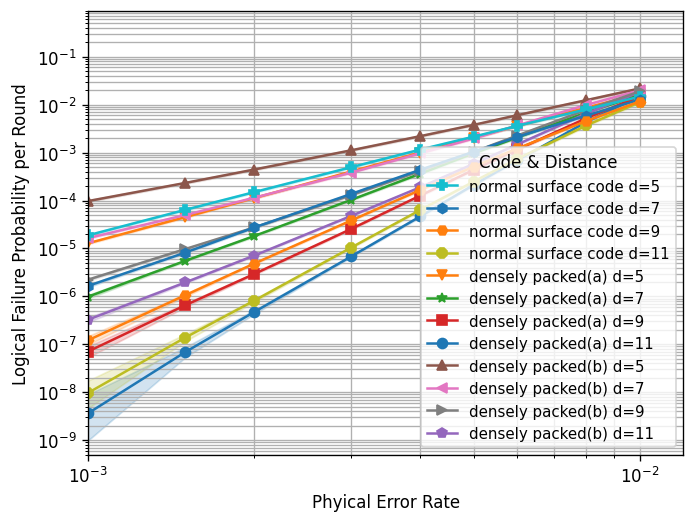

In [6]:
fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    #符号種別と距離を組み合わせて系列ごとに分ける
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
)

ax.set_ylim(5e-10, 9e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
#ax.set_title("Ordinary Surface Code")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Failure Probability per Round")
ax.grid(which='major')
ax.grid(which='minor')
handles, labels = ax.get_legend_handles_labels()

order = {
    "normal surface code": 0,
    "densely packed(a)": 1,
    "densely packed(b)": 2
}

def sort_key_code_first(label):
    parts = label.split("d=")
    code = parts[0].strip()
    d = int(parts[1].strip())
    return (order.get(code, 99), d)  # 符号優先, その中で距離順

sorted_pairs = sorted(zip(handles, labels), key=lambda hl: sort_key_code_first(hl[1]))
handles, labels = zip(*sorted_pairs)
ax.legend(handles, labels, title="Code & Distance", fontsize=9)

#ax.legend()
fig.set_dpi(120)  # Show it bigger
plt.savefig("one_vs_dense_x_error(a)_vs_(b).pdf")

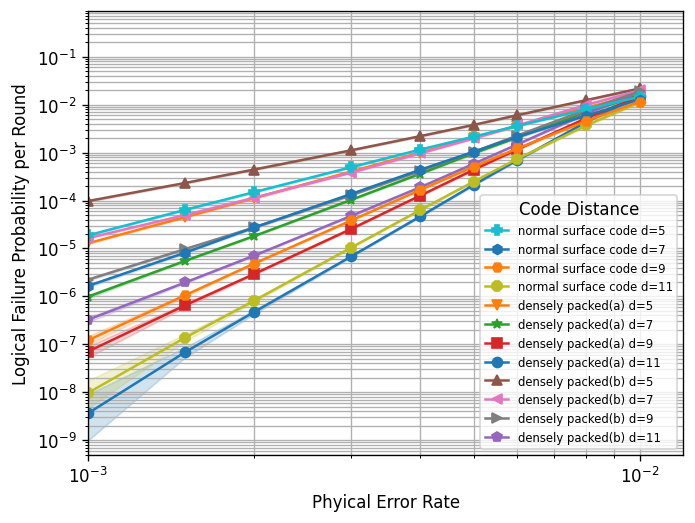

In [10]:
fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    #符号種別と距離を組み合わせて系列ごとに分ける
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
)

ax.set_ylim(5e-10, 9e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
#ax.set_title("Ordinary Surface Code")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Failure Probability per Round")
ax.grid(which='major')
ax.grid(which='minor')
handles, labels = ax.get_legend_handles_labels()

order = {
    "normal surface code": 0,
    "densely packed(a)": 1,
    "densely packed(b)": 2
}

def sort_key_code_first(label):
    parts = label.split("d=")
    code = parts[0].strip()
    d = int(parts[1].strip())
    return (order.get(code, 99), d)  # 符号優先, その中で距離順

sorted_pairs = sorted(zip(handles, labels), key=lambda hl: sort_key_code_first(hl[1]))
handles, labels = zip(*sorted_pairs)
ax.legend(handles, labels, title="Code Distance", fontsize=7)

#ax.legend()
fig.set_dpi(120)  # Show it bigger
plt.savefig("one_vs_dense_x_error(a)_vs_(b).pdf")

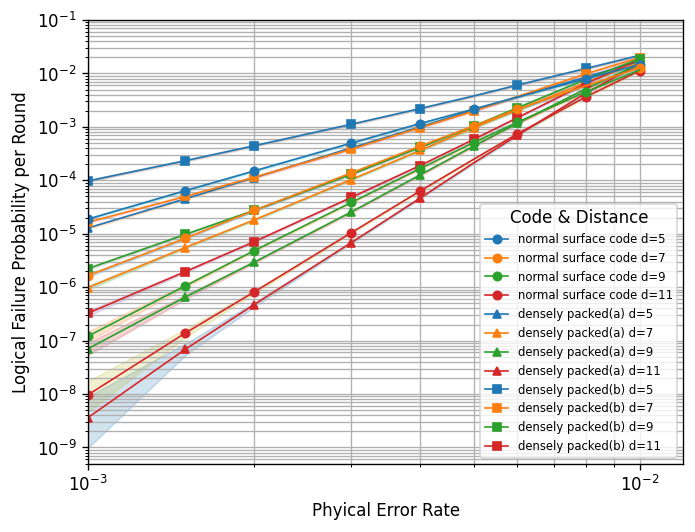

In [11]:
fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    #符号種別と距離を組み合わせて系列ごとに分ける
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
)

ax.set_ylim(5e-10, 1e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
#ax.set_title("Ordinary Surface Code")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Failure Probability per Round")
ax.grid(which='major')
ax.grid(which='minor')
handles, labels = ax.get_legend_handles_labels()

# 色を距離ごとに統一
colors = {
    5: "tab:blue",
    7: "tab:orange",
    9: "tab:green",
    11: "tab:red"
}

# マーカーを符号ごとに統一
markers = {
    "normal surface code": "o",
    "densely packed(a)": "^",
    "densely packed(b)": "s"
}

# ラインに色とマーカーを設定
lines = ax.get_lines()
for line, label in zip(lines, labels):
    parts = label.split("d=")
    code = parts[0].strip()
    d = int(parts[1].strip())

    # 距離ごとに色
    if d in colors:
        line.set_color(colors[d])
    # 符号ごとにマーカー
    if code in markers:
        line.set_marker(markers[code])
        line.set_markevery(0.1)  # マーカー間隔を調整（密になりすぎ防止）
    
    # 線を細くする
    line.set_linewidth(1.0)

    line.set_markersize(5)

order = {
    "normal surface code": 0,
    "densely packed(a)": 1,
    "densely packed(b)": 2
}

def sort_key_code_first(label):
    parts = label.split("d=")
    code = parts[0].strip()
    d = int(parts[1].strip())
    return (order.get(code, 99), d)  # 符号優先, その中で距離順

sorted_pairs = sorted(zip(handles, labels), key=lambda hl: sort_key_code_first(hl[1]))
handles, labels = zip(*sorted_pairs)
ax.legend(handles, labels, title="Code & Distance", fontsize=7)

#ax.legend()
fig.set_dpi(120)  # Show it bigger
plt.savefig("one_vs_dense_x_error(a)_vs_(b)2.pdf")

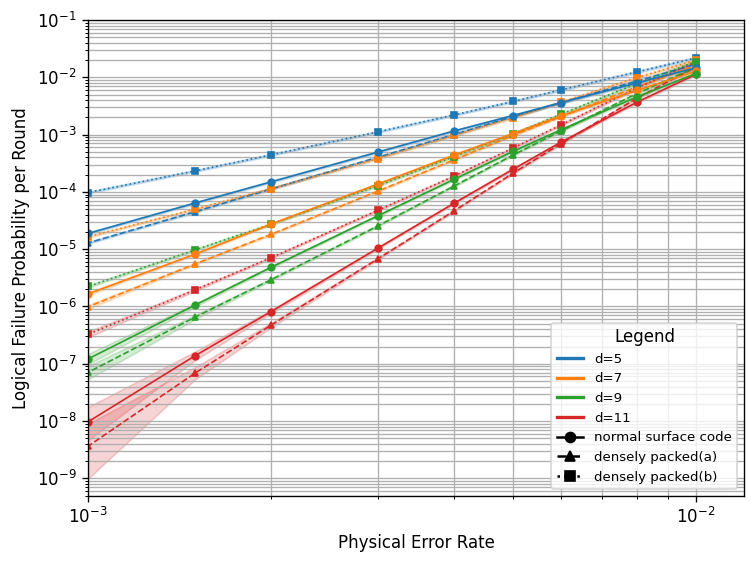

In [12]:
from matplotlib.lines import Line2D

# 距離ごとの色
color_by_distance = {
    5: "tab:blue",
    7: "tab:orange",
    9: "tab:green",
    11: "tab:red"
}

# 符号ごとのマーカー
marker_by_code = {
    "normal surface code": "o",
    "densely packed(a)": "^",
    "densely packed(b)": "s"
}

# 符号ごとの線種
linestyle_by_code = {
    "normal surface code": "solid",
    "densely packed(a)": "dashed",
    "densely packed(b)": "dotted"
}

fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
    plot_args_func=lambda curve_index, curve_group_key, group_stats: {
        'color': color_by_distance[group_stats[0].json_metadata['d']],
        'marker': marker_by_code[group_stats[0].json_metadata['code']],
        'linestyle': linestyle_by_code[group_stats[0].json_metadata['code']],
        'linewidth': 1.0,
        'markersize': 4,
    }
)

ax.set_ylim(5e-10, 1e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
ax.set_xlabel("Physical Error Rate")
ax.set_ylabel("Logical Failure Probability per Round")
ax.grid(which='major')
ax.grid(which='minor')

# ---- カスタム凡例（1つにまとめる） ----
legend_elements = []

# 距離ごとの凡例（色）
for d in sorted(color_by_distance.keys()):
    legend_elements.append(
        Line2D([0], [0], color=color_by_distance[d], lw=2, label=f"d={d}")
    )

# 符号種ごとの凡例（線種 + マーカー）
for code in marker_by_code.keys():
    legend_elements.append(
        Line2D([0], [0],
               color='black',
               marker=marker_by_code[code],
               linestyle=linestyle_by_code[code],
               lw=1.5,
               markersize=6,
               label=code)
    )

# 右下に凡例を表示
ax.legend(handles=legend_elements, loc="lower right", fontsize=8, title="Legend")

fig.set_dpi(120)
plt.tight_layout()
plt.savefig("one_vs_dense_x_error(a)_vs_(b)5.pdf")
plt.show()


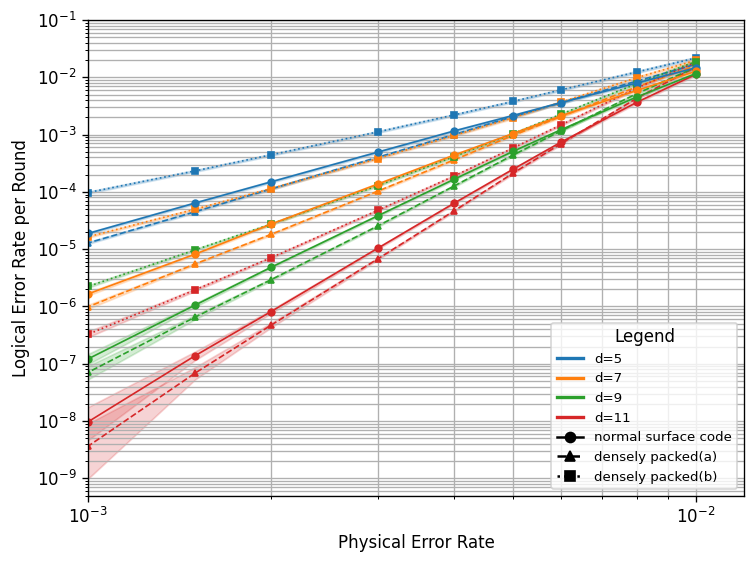

In [13]:
from matplotlib.lines import Line2D

# 距離ごとの色
color_by_distance = {
    5: "tab:blue",
    7: "tab:orange",
    9: "tab:green",
    11: "tab:red"
}

# 符号ごとのマーカー
marker_by_code = {
    "normal surface code": "o",
    "densely packed(a)": "^",
    "densely packed(b)": "s"
}

# 符号ごとの線種
linestyle_by_code = {
    "normal surface code": "solid",
    "densely packed(a)": "dashed",
    "densely packed(b)": "dotted"
}

fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
    plot_args_func=lambda curve_index, curve_group_key, group_stats: {
        'color': color_by_distance[group_stats[0].json_metadata['d']],
        'marker': marker_by_code[group_stats[0].json_metadata['code']],
        'linestyle': linestyle_by_code[group_stats[0].json_metadata['code']],
        'linewidth': 1.0,
        'markersize': 4,
    }
)

ax.set_ylim(5e-10, 1e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
ax.set_xlabel("Physical Error Rate")
ax.set_ylabel("Logical Error Rate per Round")
ax.grid(which='major')
ax.grid(which='minor')

# ---- カスタム凡例（1つにまとめる） ----
legend_elements = []

# 距離ごとの凡例（色）
for d in sorted(color_by_distance.keys()):
    legend_elements.append(
        Line2D([0], [0], color=color_by_distance[d], lw=2, label=f"d={d}")
    )

# 符号種ごとの凡例（線種 + マーカー）
for code in marker_by_code.keys():
    legend_elements.append(
        Line2D([0], [0],
               color='black',
               marker=marker_by_code[code],
               linestyle=linestyle_by_code[code],
               lw=1.5,
               markersize=6,
               label=code)
    )

# 右下に凡例を表示
ax.legend(handles=legend_elements, loc="lower right", fontsize=8, title="Legend")

fig.set_dpi(120)
plt.tight_layout()
plt.savefig("one_vs_dense_x_error(a)_vs_(b)6.pdf")
plt.show()


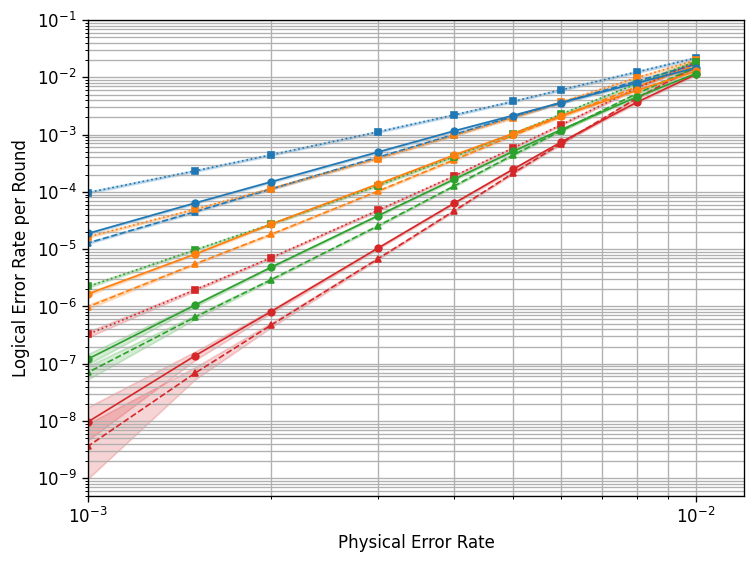

In [14]:
from matplotlib.lines import Line2D

# 距離ごとの色
color_by_distance = {
    5: "tab:blue",
    7: "tab:orange",
    9: "tab:green",
    11: "tab:red"
}

# 符号ごとのマーカー
marker_by_code = {
    "normal surface code": "o",
    "densely packed(a)": "^",
    "densely packed(b)": "s"
}

# 符号ごとの線種
linestyle_by_code = {
    "normal surface code": "solid",
    "densely packed(a)": "dashed",
    "densely packed(b)": "dotted"
}

fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
    plot_args_func=lambda curve_index, curve_group_key, group_stats: {
        'color': color_by_distance[group_stats[0].json_metadata['d']],
        'marker': marker_by_code[group_stats[0].json_metadata['code']],
        'linestyle': linestyle_by_code[group_stats[0].json_metadata['code']],
        'linewidth': 1.0,
        'markersize': 4,
    }
)

ax.set_ylim(5e-10, 1e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
ax.set_xlabel("Physical Error Rate")
ax.set_ylabel("Logical Error Rate per Round")
ax.grid(which='major')
ax.grid(which='minor')

# ---- カスタム凡例（1つにまとめる） ----
legend_elements = []

# 距離ごとの凡例（色）
for d in sorted(color_by_distance.keys()):
    legend_elements.append(
        Line2D([0], [0], color=color_by_distance[d], lw=2, label=f"d={d}")
    )

# 符号種ごとの凡例（線種 + マーカー）
for code in marker_by_code.keys():
    legend_elements.append(
        Line2D([0], [0],
               color='black',
               marker=marker_by_code[code],
               linestyle=linestyle_by_code[code],
               lw=1.5,
               markersize=6,
               label=code)
    )

# 右下に凡例を表示
#ax.legend(handles=legend_elements, loc="lower right", fontsize=8, title="Legend")

fig.set_dpi(120)
plt.tight_layout()
plt.savefig("one_vs_dense_x_error(a)_vs_(b)7.pdf")
plt.show()


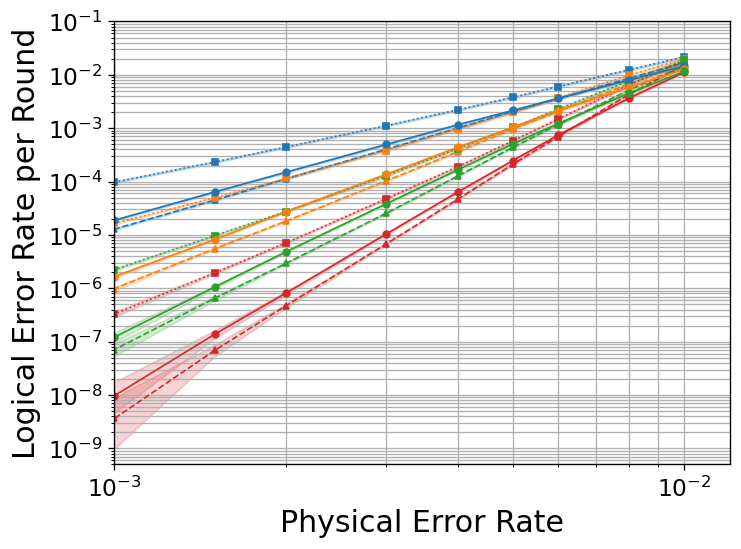

In [19]:
from matplotlib.lines import Line2D

# 距離ごとの色
color_by_distance = {
    5: "tab:blue",
    7: "tab:orange",
    9: "tab:green",
    11: "tab:red"
}

# 符号ごとのマーカー
marker_by_code = {
    "normal surface code": "o",
    "densely packed(a)": "^",
    "densely packed(b)": "s"
}

# 符号ごとの線種
linestyle_by_code = {
    "normal surface code": "solid",
    "densely packed(a)": "dashed",
    "densely packed(b)": "dotted"
}

fig, ax = plt.subplots(1, 1)

sinter.plot_error_rate(
    ax=ax,
    stats=collected_surface_code_stats,
    x_func=lambda stat: stat.json_metadata['p'],
    group_func=lambda stat: f"{stat.json_metadata['code']} d={stat.json_metadata['d']}",
    failure_units_per_shot_func=lambda stat: stat.json_metadata['round'],
    plot_args_func=lambda curve_index, curve_group_key, group_stats: {
        'color': color_by_distance[group_stats[0].json_metadata['d']],
        'marker': marker_by_code[group_stats[0].json_metadata['code']],
        'linestyle': linestyle_by_code[group_stats[0].json_metadata['code']],
        'linewidth': 1.0,
        'markersize': 4,
    }
)

ax.set_ylim(5e-10, 1e-1)
ax.set_xlim(0.001, 0.012)
ax.loglog()
ax.set_xlabel("Physical Error Rate", fontsize=18)
ax.set_ylabel("Logical Error Rate per Round", fontsize=18)
ax.grid(which='major')
ax.grid(which='minor')

# ---- カスタム凡例（1つにまとめる） ----
legend_elements = []

# 距離ごとの凡例（色）
for d in sorted(color_by_distance.keys()):
    legend_elements.append(
        Line2D([0], [0], color=color_by_distance[d], lw=2, label=f"d={d}")
    )

# 符号種ごとの凡例（線種 + マーカー）
for code in marker_by_code.keys():
    legend_elements.append(
        Line2D([0], [0],
               color='black',
               marker=marker_by_code[code],
               linestyle=linestyle_by_code[code],
               lw=1.5,
               markersize=6,
               label=code)
    )

# 右下に凡例を表示
#ax.legend(handles=legend_elements, loc="lower right", fontsize=8, title="Legend")
#plt.rcParams["font.size"] = 14
fig.set_dpi(120)
plt.tight_layout()
plt.savefig("one_vs_dense_x_error(a)_vs_(b)9.pdf")
plt.show()
